In [1]:
using HDF5
using Gadfly
using Compose
using Colors

INFO: Recompiling stale cache file /Users/mira/.julia/lib/v0.4/HDF5.ji for module HDF5.
INFO: Recompiling stale cache file /Users/mira/.julia/lib/v0.4/Blosc.ji for module Blosc.
INFO: Recompiling stale cache file /Users/mira/.julia/lib/v0.4/Gadfly.ji for module Gadfly.
INFO: Recompiling stale cache file /Users/mira/.julia/lib/v0.4/Codecs.ji for module Codecs.
INFO: Recompiling stale cache file /Users/mira/.julia/lib/v0.4/Colors.ji for module Colors.
INFO: Recompiling stale cache file /Users/mira/.julia/lib/v0.4/FixedPointNumbers.ji for module FixedPointNumbers.
INFO: Recompiling stale cache file /Users/mira/.julia/lib/v0.4/ColorTypes.ji for module ColorTypes.
INFO: Recompiling stale cache file /Users/mira/.julia/lib/v0.4/Reexport.ji for module Reexport.
INFO: Recompiling stale cache file /Users/mira/.julia/lib/v0.4/Compose.ji for module Compose.
INFO: Recompiling stale cache file /Users/mira/.julia/lib/v0.4/Iterators.ji for module Iterators.
INFO: Recompiling stale cache file /Users/mi

In [2]:
fid=h5open("twoflux_periodic.h5","r")
fid2=h5open("openbound.h5","r")

HDF5 data file: openbound.h5

In [33]:
names(fid["50/6"])

9-element Array{ByteString,1}:
 "3750 1"   
 "attempt"  
 "nflip 10" 
 "nflip 20" 
 "nflip 5"  
 "sep 12"   
 "sep 13"   
 "sep 5"    
 "sequnce 3"

In [39]:
h=fid["50/6/3750 1"]
h2=fid2["50/5"]
names(h)

15-element Array{ByteString,1}:
 "Bondaryb"
 "Bondaryw"
 "Bondsb"  
 "Bondsw"  
 "E"       
 "J"       
 "S"       
 "U"       
 "V"       
 "Xb"      
 "Xw"      
 "heights" 
 "i0b"     
 "i0w"     
 "omega"   

In [40]:
Xb=read(h["Xb"]);
Xw=read(h["Xw"]);
E=read(h["E"]);
S=read(h["S"]);
U=read(h["U"]);
V=read(h["V"]);
Bondsb=read(h["Bondsb"]);
Bondsw=read(h["Bondsw"]);
i0b=read(h["i0b"]);
heights=read(h["heights"]);
omega=read(h["omega"]);

In [17]:
Xb2=read(h2["Xb"]);
Xw2=read(h2["Xw"]);
E2=read(h2["E"]);
S2=read(h2["S"]);
U2=read(h2["U"]);
V2=read(h2["V"]);
Bondsb2=read(h2["Bondsb"]);
Bondsw2=read(h2["Bondsw"]);
i0b2=read(h2["i0b"]);
heights2=read(h2["heights"]);
omega2=read(h2["omega"]);

In [41]:
sum(E)-11809.44885304155

-0.44338421030806785

In [45]:
E[end]

0.0007972715570377313

In [42]:
sep=[1,3,5,10,12,13,20]
Esep=[.44338,.29446,.294464,.29034,.28476112,.28476112,.285760]

7-element Array{Float64,1}:
 0.44338 
 0.29446 
 0.294464
 0.29034 
 0.284761
 0.284761
 0.28576 

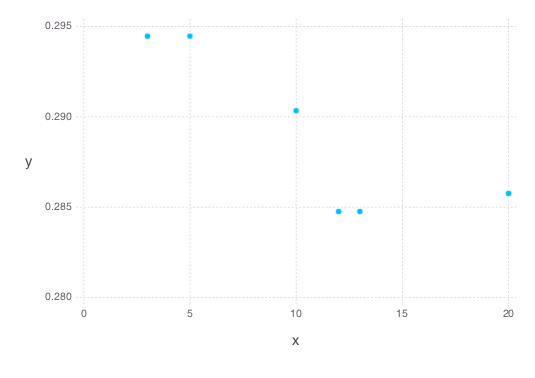

In [44]:
plot(x=sep[2:end],y=Esep[2:end])

In [10]:
base03=parse(Colorant,"#002b36");
base02=parse(Colorant,"#073642");
base01=parse(Colorant,"#586e75");
base00=parse(Colorant,"#657b83");
base0=parse(Colorant,"#839496");
base1=parse(Colorant,"#839496");
base2=parse(Colorant,"#eee8d5");
base3=parse(Colorant,"#fdf6e3");

yellow=parse(Colorant,"#b58900");
orange=parse(Colorant,"#cb4b16");
red=parse(Colorant,"#dc322f");
magenta=parse(Colorant,"#d33682");
violet=parse(Colorant,"#6c71c4");
blue=parse(Colorant,"#268bd2");
cyan=parse(Colorant,"#3aa198");
green=parse(Colorant,"#859900");

In [11]:
N=7500;
t=Theme(highlight_width=0pt,default_point_size=.75pt,background_color=base03,
    grid_color=base2,minor_label_color=base2,key_label_color=base2,
    key_title_color=cyan,major_label_color=cyan
);

lx=Guide.xlabel("x");
ly=Guide.ylabel("y");

dsc=Scale.ContinuousColorScale(Scale.lab_gradient(red,base00,yellow));
sc=Scale.ContinuousColorScale(Scale.lab_gradient(magenta,violet,blue,cyan,green));

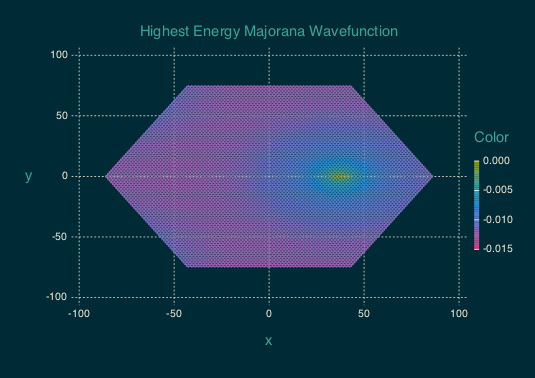

In [31]:
state=1;
bsites=layer(x=Xb[:,1],y=Xb[:,2],color=V[:,state],Geom.point,t)
wsites=layer(x=Xw[:,1],y=Xw[:,2],color=U[:,state],Geom.point,t)
plot(bsites,wsites,sc,t,lx,ly,Guide.title("Highest Energy Majorana Wavefunction"))

In [ ]:
state=1;
bsites=layer(x=Xb[:,1],y=Xb[:,2],color=V[:,state]-V2[:,state],Geom.point,t)
wsites=layer(x=Xw[:,1],y=Xw[:,2],color=U[:,state]-U2[:,state],Geom.point,t)
plot(bsites,wsites,sc,t,lx,ly,Guide.title("Highest Energy Majorana Wavefunction"))

In [ ]:
state=1;
bsites=layer(x=Xb[:,1],y=Xb[:,2],color=V2[:,state],Geom.point,t)
wsites=layer(x=Xw[:,1],y=Xw[:,2],color=U2[:,state],Geom.point,t)
plot(bsites,wsites,sc,t,lx,ly,Guide.title("Highest Energy Majorana Wavefunction"))

In [ ]:
state=2;
bsites=layer(x=Xb[:,1],y=Xb[:,2],color=V[:,state]-V2[:,state],Geom.point,t)
wsites=layer(x=Xw[:,1],y=Xw[:,2],color=U[:,state]-U2[:,state],Geom.point,t)
plot(bsites,wsites,sc,t,lx,ly,Guide.title("Next to Highest Energy Majorana Wavefunction"))

In [ ]:
bsites=layer(x=Xb[:,1],y=Xb[:,2],color=V[:,state]-V2[:,state],Geom.point,t)
wsites=layer(x=Xw[:,1],y=Xw[:,2],color=U[:,state]-U2[:,state],Geom.point,t)
plot(bsites,wsites,sc,t)

In [ ]:
bsites=layer(x=Xb[:,1],y=Xb[:,2],color=V[:,4000],Geom.point,t)
wsites=layer(x=Xw[:,1],y=Xw[:,2],color=U[:,4000],Geom.point,t)
plot(bsites,wsites,sc,t)


In [ ]:
bsites=layer(x=Xb[:,1],y=Xb[:,2],color=V[:,7000],Geom.point,t)
wsites=layer(x=Xw[:,1],y=Xw[:,2],color=U[:,7000],Geom.point,t)
plot(bsites,wsites,sc,t)

In [ ]:
bsites=layer(x=Xb[:,1],y=Xb[:,2],color=log(abs(V[:,7000])),Geom.point,t)
wsites=layer(x=Xw[:,1],y=Xw[:,2],color=log(abs(U[:,7000])),Geom.point,t)
plot(bsites,wsites,sc,t)

In [ ]:
bsites=layer(x=Xb[:,1],y=Xb[:,2],color=V[:,7000],Geom.point,t)
wsites=layer(x=Xw[:,1],y=Xw[:,2],color=U[:,7000],Geom.point,t)
plot(bsites,wsites,sc,t)

In [ ]:
hsy=(1+sin(pi/6))
hsx=3*cos(pi/6);
sp=[80,20];
ep=[45,60];
w=2;
spx=75;
spy=20;
epx=spx-15*hsy;
epy=spy+15*hsx;

In [14]:
i0=round(Int,N/2)-20
fs=[i0+l for l in 0:19];

In [ ]:
E

In [15]:
tp=Theme(highlight_width=0pt,default_point_size=.7pt,background_color=base03,
    grid_color=base2,minor_label_color=base2,key_label_color=base2,
    key_title_color=cyan,major_label_color=cyan
);
tppp=Theme(highlight_width=0pt,default_point_size=.75pt,background_color=base03,
    grid_color=base2,minor_label_color=base2,key_label_color=base2,
    key_title_color=cyan,major_label_color=cyan
);

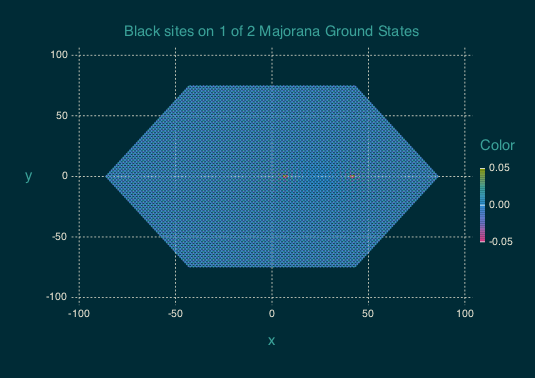

In [16]:
bsites=layer(x=Xb[:,1],y=Xb[:,2],color=V[:,end],Geom.point,tp)
wsites=layer(x=Xw[:,1],y=Xw[:,2],color=U[:,end],Geom.point,tp)

vortex=layer(x=Xw[fs,1],y=Xw[fs,2]+.5,Geom.point)

plot(bsites,wsites,sc,lx,ly,
Guide.title("Black sites on 1 of 2 Majorana Ground States"),tp)

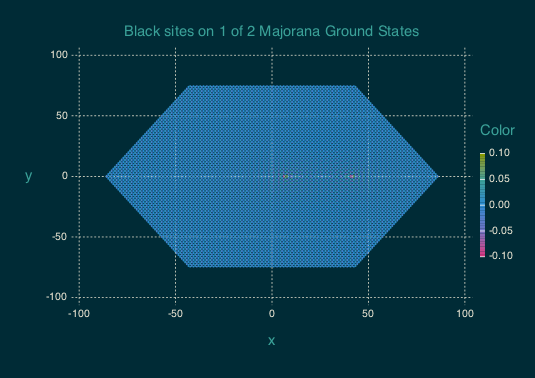

In [19]:
bsites=layer(x=Xb[:,1],y=Xb[:,2],color=V[:,end-1],Geom.point,tp)
wsites=layer(x=Xw[:,1],y=Xw[:,2],color=U[:,end-1],Geom.point,tp)

plot(bsites,wsites,sc,lx,ly,
Guide.title("Black sites on 1 of 2 Majorana Ground States"),tp)

In [ ]:
plot(wsites,sc,lx,ly,
Guide.title("White sites on 1 of 2 Majorana Ground States"),tp)

In [ ]:
tp=Theme(highlight_width=0pt,default_point_size=6pt,background_color=base03,
    grid_color=base2,minor_label_color=base2,key_label_color=base2,
    key_title_color=cyan,major_label_color=cyan
);

bsites=layer(x=Xb[:,1],y=Xb[:,2],color=(V[:,end]/V[1,end]),Geom.point,tp)
wsites=layer(x=Xw[:,1],y=Xw[:,2],color=(U[:,end]/U[1,end]),Geom.point,tp)
#bsites2=layer(x=Xb[:,1]-.2,y=Xb[:,2],color=V[end:-1:1,end],Geom.point,tpp)
#wsites2=layer(x=Xw[:,1]-.2,y=Xw[:,2],color=U[end:-1:1,end],Geom.point,tpp)

plot(wsites,bsites,
sc,lx,ly,
Guide.title("Majorana Ground States"),
tp)


In [ ]:
bsites=layer(x=Xb[:,1],y=Xb[:,2],color=(V[:,end]-V[:,end-1]),Geom.point,tpp)
wsites=layer(x=Xw[:,1],y=Xw[:,2],color=(U[:,end]-U[:,end-1]),Geom.point,tpp)

plot(wsites,bsites,sc,lx,ly,
Guide.title("Majorana Ground States"),
Coord.Cartesian(ymin=0,ymax=10,xmin=0,xmax=10),tpp)
0

In [ ]:
bsites=layer(x=Xb[:,1],y=Xb[:,2],color=V[:,end-2],Geom.point,tppp)
wsites=layer(x=Xw[:,1],y=Xw[:,2],color=U[:,end-2],Geom.point,tppp)

plot(wsites,bsites,sc,lx,ly,
Guide.title("adsfasdf"),tppp)
0

In [ ]:
bsites=layer(x=Xb[:,1],y=Xb[:,2],color=V[:,end-3],Geom.point,tppp)
wsites=layer(x=Xw[:,1],y=Xw[:,2],color=U[:,end-3],Geom.point,tppp)

plot(wsites,bsites,sc,lx,ly,
Guide.title("adsfasdf"),tppp)
0

In [ ]:
bsites=layer(x=Xb[:,1],y=Xb[:,2],color=V[:,end-4],Geom.point,tppp)
wsites=layer(x=Xw[:,1],y=Xw[:,2],color=U[:,end-4],Geom.point,tppp)

plot(wsites,bsites,sc,lx,ly,
Guide.title("adsfasdf"),tppp)
0

In [ ]:
bsites=layer(x=Xb[:,1],y=Xb[:,2],color=V[:,end-1],Geom.point,tp)
wsites=layer(x=Xw[:,1],y=Xw[:,2],color=U[:,end-1],Geom.point,tp)
plot(bsites,sc,lx,ly,
Guide.title("Black sites on 2 of 2 Majorana Ground States"),
Coord.Cartesian(ymin=0,ymax=10,xmin=0,xmax=10),tp)
0

In [ ]:
plot(wsites,sc,lx,ly,
Guide.title("Whites sites on 2 of 2 Majorana Ground States"),
Coord.Cartesian(ymin=0,ymax=10,xmin=0,xmax=10),tp)
0

In [ ]:
plot(x=collect(1:length(E)),y=E,
Theme(highlight_width=0pt,default_point_size=1pt,background_color=base03,
    grid_color=base2,minor_label_color=base2,key_label_color=base2,
    key_title_color=cyan,major_label_color=cyan
))

In [ ]:
close(fid)

In [ ]:
maximum(U*diagm(E)*transpose(V)-S)

In [ ]:
Nx=5
N=3*Nx^2

In [ ]:
s=0
for ii in 1:N
    for b in 1:3
        s+=U[ii,end]*V[Bondsw[ii,b],end]
        println(U[ii,end]*V[Bondsw[ii,b],end],"    ",s)
    end
end

In [ ]:
s

In [ ]:
U[:,end]/U[1,end]

In [ ]:
V[:,end]/V[1,end]

In [ ]:
.107*.1603

In [ ]:
N=7500; 
site=round(Int,N/2);
  n=150;
  omega=collect(linspace(0,6,150));
  heights=zeros(omega);

  for  e in 1:N;
    k=round(Int,ceil(E[e]*50));
    heights[k]+=.5*U[site,e].^2
end

In [ ]:
t2=Theme(highlight_width=0pt,default_point_size=.75pt,background_color=base03,
    grid_color=base2,minor_label_color=base2,key_label_color=base2,
    key_title_color=cyan,major_label_color=cyan,
major_label_font_size=15pt, minor_label_font_size=10pt,
key_position=:none, panel_opacity=0
);

xl=Guide.xlabel("ω")
yl=Guide.ylabel("LDOS(ω)")
tl=Guide.title("Periodic Boundaries, Zero flux, Undistorted LDOS")
xs=Coord.Cartesian(xmin=0,xmax=6)

p=plot(x=omega,y=heights,color=zeros(length(omega)),xs,Geom.bar,xl,yl,tl,t2,Scale.color_discrete_manual(blue))
draw(SVG("hist_noflux_periodic.svg", 6inch, 6inch), p)

In [ ]:
11809/(3*50^2), 1889/(3*20^2), 117/(3*5^2)